
# CatBoost


## Classification  using CatBoost
<br>

In [34]:
# !pip install catboost
# !pip install ipywidgets

# !pip install -U pandas-profiling[notebook]
# !jupyter nbextension enable --py widgetsnbextension

#### Libraries

In [ ]:
!jupyter nbextension enable --py widgetsnbextension

from IPython.core.display import display, HTML
from IPython.display import display_html

display(  HTML( '<style>.container { width:49% !important; }</style>' )  )

import os, random, time, fsspec, gunzip, datetime, requests, copy, inspect, collections, itertools

import pandas as pd, pandas_datareader as pd_dr, re
import numpy as np, seaborn as sns
from numpy import savetxt, genfromtxt
import sklearn, sklearn_pandas
from sklearn import *
import missingno as msno
import h5py, pickle, urllib

import scipy, scipy.stats as stats, random, math
from sklearn.pipeline import Pipeline

import matplotlib, graphviz
import matplotlib.pyplot as plt
from matplotlib import *
plt.style.use('classic')

import xgboost

%matplotlib inline
%config Completer.use_jedi = False

np.random.seed(1) # set a seed so that the results are consistent

## Set Jupyter notebook display options for pandas
pd.set_option( 'display.max_columns', None )
pd.options.display.max_rows = 8

In [12]:
import catboost, pandas_profiling
from catboost import datasets

tnc_trn_df, tnc_tst_df =  datasets.titanic( )
tnc_trn_df.dropna( inplace= True );  tnc_tst_df.dropna( inplace= True )

print( tnc_trn_df.shape );  tnc_trn_df.head(3)

(183, 12)


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
6,7,0,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,51.8625,E46,S


In [13]:
features_to_model = ['Pclass', 'Sex', 'Age', 'Embarked']

xtrn, xtst, ytrn, ytst = sklearn.model_selection.train_test_split(
                                tnc_trn_df[ features_to_model ], tnc_trn_df[ ['Survived'] ],
                                test_size= 30/100, random_state= 1  )
xtrn.head(2)

,Pclass,Sex,Age,Embarked
356,1,female,22.0,S
737,1,male,35.0,C


In [15]:
cat_col = [ 'Pclass', 'Sex', 'Embarked' ]   # OR can give column index number
cat_col = [ 0, 1, 3 ]

param = {  'iterations': 100,              'learning_rate': 0.7,       'cat_features': cat_col,
           'depth': 7,                     'eval_metric': 'AUC',           'verbose': True      }

catboost_est = catboost.CatBoostClassifier( task_type= 'GPU', **param, )
catboost_est.fit( X= xtrn, y= ytrn, eval_set= (xtst, ytst), use_best_model= True, plot= True )

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8942544	test: 0.7840557	best: 0.7840557 (0)	total: 13.1ms	remaining: 1.3s
1:	learn: 0.9135431	test: 0.8204334	best: 0.8204334 (1)	total: 25.7ms	remaining: 1.26s
2:	learn: 0.9123119	test: 0.8366873	best: 0.8366873 (2)	total: 38.8ms	remaining: 1.25s
3:	learn: 0.9093023	test: 0.8351393	best: 0.8366873 (2)	total: 47.8ms	remaining: 1.15s
4:	learn: 0.9300958	test: 0.8614551	best: 0.8614551 (4)	total: 61.4ms	remaining: 1.17s
5:	learn: 0.9311901	test: 0.8660991	best: 0.8660991 (5)	total: 74.8ms	remaining: 1.17s
6:	learn: 0.9351573	test: 0.8622291	best: 0.8660991 (5)	total: 88.3ms	remaining: 1.17s
7:	learn: 0.9370725	test: 0.8668731	best: 0.8668731 (7)	total: 102ms	remaining: 1.17s
8:	learn: 0.9470588	test: 0.8699690	best: 0.8699690 (8)	total: 118ms	remaining: 1.19s
9:	learn: 0.9497948	test: 0.8730650	best: 0.8730650 (9)	total: 131ms	remaining: 1.18s
10:	learn: 0.9536252	test: 0.8699690	best: 0.8730650 (9)	total: 145ms	remaining: 1.17s
11:	learn: 0.9563611	test: 0.8684210	best: 0.87

In [106]:
 catboost_est.get_feature_importance()

array([17.46891925, 44.04516865, 29.39461606,  9.09129604])

[ 2.34587126  4.32380701 23.51254458 69.81777715]


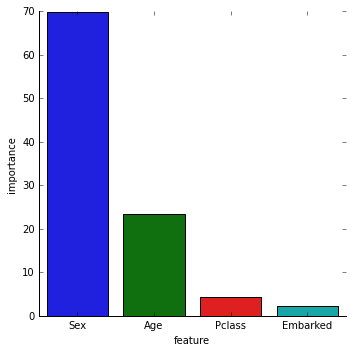

In [17]:
## feature importance

featureImp_df =  pd.DataFrame(  data=
                    [   i for i in zip( features_to_model, catboost_est.get_feature_importance() )  ],
                                 columns= [ 'feature', 'importance' ]
                              )

print( np.sort( catboost_est.get_feature_importance() ) )
sns.catplot( x= 'feature', y= 'importance', data= featureImp_df.sort_values( 'importance', ascending= False ), kind= 'bar' );

<br>

## Regression using CatBoost
*[Go to top](#toc)* 

In [18]:
warnings.filterwarnings( action= 'ignore' )

bostonRaw_dataset = sklearn.datasets.load_boston()

boston_df = pd.DataFrame( data=  bostonRaw_dataset.data, columns= bostonRaw_dataset.feature_names )

boston_df['house_price'] = bostonRaw_dataset.target

boston_df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,house_price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [19]:
pandas_profiling.ProfileReport( boston_df )

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
for e_ln in bostonRaw_dataset.DESCR.split( '\n' ):
    print( e_ln )

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [20]:
xtrn,xtst, ytrn, ytst = sklearn.model_selection.train_test_split(
                                boston_df.drop( columns= 'house_price' ), boston_df['house_price'],
                                test_size= 30./100, random_state= 1 )
xtrn.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
13,0.62976,0.0,8.14,0.0,0.538,5.949,61.8,4.7075,4.0,307.0,21.0,396.90,8.26
61,0.17171,25.0,5.13,0.0,0.453,5.966,93.4,6.8185,8.0,284.0,19.7,378.08,14.44
377,9.82349,0.0,18.10,0.0,0.671,6.794,98.8,1.3580,24.0,666.0,20.2,396.90,21.24
39,0.02763,75.0,2.95,0.0,0.428,6.595,21.8,5.4011,3.0,252.0,18.3,395.63,4.32
365,4.55587,0.0,18.10,0.0,0.718,3.561,87.9,1.6132,24.0,666.0,20.2,354.70,7.12


In [22]:
param = {  'iterations': 2000, 'learning_rate': 0.01, 'depth': 6,
           'loss_function': 'RMSE', 'eval_metric': 'RMSE',
           'od_type': 'Iter', 'od_wait': 100,  
           'verbose': True, 'use_best_model': True  }

catboostReg_est = catboost.CatBoostRegressor( **param )

catboostReg_est.fit( xtrn, ytrn, eval_set= (xtst,ytst), plot= True  )

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 8.9666765	test: 9.5541176	best: 9.5541176 (0)	total: 7.52ms	remaining: 15s
1:	learn: 8.9185561	test: 9.5074409	best: 9.5074409 (1)	total: 8.77ms	remaining: 8.76s
2:	learn: 8.8670681	test: 9.4521955	best: 9.4521955 (2)	total: 10ms	remaining: 6.69s
3:	learn: 8.8197553	test: 9.4143004	best: 9.4143004 (3)	total: 11.3ms	remaining: 5.64s
4:	learn: 8.7708847	test: 9.3660821	best: 9.3660821 (4)	total: 12.6ms	remaining: 5.01s
5:	learn: 8.7292528	test: 9.3278003	best: 9.3278003 (5)	total: 13.6ms	remaining: 4.52s
6:	learn: 8.6792248	test: 9.2800513	best: 9.2800513 (6)	total: 14.7ms	remaining: 4.19s
7:	learn: 8.6337896	test: 9.2355711	best: 9.2355711 (7)	total: 15.9ms	remaining: 3.96s
8:	learn: 8.5891866	test: 9.1909429	best: 9.1909429 (8)	total: 17.1ms	remaining: 3.78s
9:	learn: 8.5363638	test: 9.1407718	best: 9.1407718 (9)	total: 18.3ms	remaining: 3.63s
10:	learn: 8.4915245	test: 9.0971552	best: 9.0971552 (10)	total: 19.4ms	remaining: 3.5s
11:	learn: 8.4458796	test: 9.0557039	best: 9.0

151:	learn: 4.5564203	test: 5.2328124	best: 5.2328124 (151)	total: 175ms	remaining: 2.13s
152:	learn: 4.5410995	test: 5.2170991	best: 5.2170991 (152)	total: 176ms	remaining: 2.13s
153:	learn: 4.5240982	test: 5.1982159	best: 5.1982159 (153)	total: 177ms	remaining: 2.13s
154:	learn: 4.5083944	test: 5.1845623	best: 5.1845623 (154)	total: 179ms	remaining: 2.13s
155:	learn: 4.4925856	test: 5.1720717	best: 5.1720717 (155)	total: 180ms	remaining: 2.12s
156:	learn: 4.4795060	test: 5.1551550	best: 5.1551550 (156)	total: 181ms	remaining: 2.12s
157:	learn: 4.4630734	test: 5.1384394	best: 5.1384394 (157)	total: 182ms	remaining: 2.12s
158:	learn: 4.4453345	test: 5.1216518	best: 5.1216518 (158)	total: 183ms	remaining: 2.12s
159:	learn: 4.4315189	test: 5.1117261	best: 5.1117261 (159)	total: 185ms	remaining: 2.12s
160:	learn: 4.4182492	test: 5.0995812	best: 5.0995812 (160)	total: 186ms	remaining: 2.12s
161:	learn: 4.4039930	test: 5.0847315	best: 5.0847315 (161)	total: 187ms	remaining: 2.12s
162:	learn

319:	learn: 2.9641564	test: 3.6814978	best: 3.6814978 (319)	total: 347ms	remaining: 1.82s
320:	learn: 2.9592360	test: 3.6775281	best: 3.6775281 (320)	total: 348ms	remaining: 1.82s
321:	learn: 2.9541054	test: 3.6705482	best: 3.6705482 (321)	total: 350ms	remaining: 1.82s
322:	learn: 2.9493876	test: 3.6659270	best: 3.6659270 (322)	total: 351ms	remaining: 1.82s
323:	learn: 2.9447922	test: 3.6618551	best: 3.6618551 (323)	total: 352ms	remaining: 1.82s
324:	learn: 2.9399947	test: 3.6568706	best: 3.6568706 (324)	total: 353ms	remaining: 1.82s
325:	learn: 2.9351221	test: 3.6506659	best: 3.6506659 (325)	total: 354ms	remaining: 1.82s
326:	learn: 2.9313912	test: 3.6455205	best: 3.6455205 (326)	total: 355ms	remaining: 1.82s
327:	learn: 2.9264101	test: 3.6403940	best: 3.6403940 (327)	total: 357ms	remaining: 1.82s
328:	learn: 2.9211512	test: 3.6359597	best: 3.6359597 (328)	total: 358ms	remaining: 1.82s
329:	learn: 2.9152204	test: 3.6308300	best: 3.6308300 (329)	total: 359ms	remaining: 1.82s
330:	learn

488:	learn: 2.3308459	test: 3.1528567	best: 3.1528567 (488)	total: 519ms	remaining: 1.6s
489:	learn: 2.3278514	test: 3.1507224	best: 3.1507224 (489)	total: 521ms	remaining: 1.6s
490:	learn: 2.3257065	test: 3.1484581	best: 3.1484581 (490)	total: 522ms	remaining: 1.6s
491:	learn: 2.3230858	test: 3.1465803	best: 3.1465803 (491)	total: 523ms	remaining: 1.6s
492:	learn: 2.3193683	test: 3.1453541	best: 3.1453541 (492)	total: 524ms	remaining: 1.6s
493:	learn: 2.3172360	test: 3.1445552	best: 3.1445552 (493)	total: 525ms	remaining: 1.6s
494:	learn: 2.3149163	test: 3.1427648	best: 3.1427648 (494)	total: 526ms	remaining: 1.6s
495:	learn: 2.3112229	test: 3.1412601	best: 3.1412601 (495)	total: 527ms	remaining: 1.6s
496:	learn: 2.3091752	test: 3.1396770	best: 3.1396770 (496)	total: 528ms	remaining: 1.6s
497:	learn: 2.3078290	test: 3.1370137	best: 3.1370137 (497)	total: 529ms	remaining: 1.59s
498:	learn: 2.3059044	test: 3.1351555	best: 3.1351555 (498)	total: 530ms	remaining: 1.59s
499:	learn: 2.30358

630:	learn: 2.0125163	test: 2.9656939	best: 2.9656939 (630)	total: 692ms	remaining: 1.5s
631:	learn: 2.0102606	test: 2.9647230	best: 2.9647230 (631)	total: 693ms	remaining: 1.5s
632:	learn: 2.0082843	test: 2.9640489	best: 2.9640489 (632)	total: 695ms	remaining: 1.5s
633:	learn: 2.0062678	test: 2.9640615	best: 2.9640489 (632)	total: 696ms	remaining: 1.5s
634:	learn: 2.0041280	test: 2.9622037	best: 2.9622037 (634)	total: 697ms	remaining: 1.5s
635:	learn: 2.0016320	test: 2.9608090	best: 2.9608090 (635)	total: 698ms	remaining: 1.5s
636:	learn: 1.9992422	test: 2.9588773	best: 2.9588773 (636)	total: 700ms	remaining: 1.5s
637:	learn: 1.9974403	test: 2.9575982	best: 2.9575982 (637)	total: 701ms	remaining: 1.5s
638:	learn: 1.9951824	test: 2.9566777	best: 2.9566777 (638)	total: 702ms	remaining: 1.49s
639:	learn: 1.9930012	test: 2.9567629	best: 2.9566777 (638)	total: 703ms	remaining: 1.49s
640:	learn: 1.9905546	test: 2.9549602	best: 2.9549602 (640)	total: 704ms	remaining: 1.49s
641:	learn: 1.9890

773:	learn: 1.7654867	test: 2.8823645	best: 2.8823645 (773)	total: 865ms	remaining: 1.37s
774:	learn: 1.7640784	test: 2.8826433	best: 2.8823645 (773)	total: 866ms	remaining: 1.37s
775:	learn: 1.7630272	test: 2.8825578	best: 2.8823645 (773)	total: 867ms	remaining: 1.37s
776:	learn: 1.7611700	test: 2.8819614	best: 2.8819614 (776)	total: 869ms	remaining: 1.37s
777:	learn: 1.7594989	test: 2.8817052	best: 2.8817052 (777)	total: 870ms	remaining: 1.37s
778:	learn: 1.7580452	test: 2.8817829	best: 2.8817052 (777)	total: 871ms	remaining: 1.36s
779:	learn: 1.7575081	test: 2.8824028	best: 2.8817052 (777)	total: 872ms	remaining: 1.36s
780:	learn: 1.7557482	test: 2.8817191	best: 2.8817052 (777)	total: 874ms	remaining: 1.36s
781:	learn: 1.7544895	test: 2.8812084	best: 2.8812084 (781)	total: 875ms	remaining: 1.36s
782:	learn: 1.7537781	test: 2.8810299	best: 2.8810299 (782)	total: 876ms	remaining: 1.36s
783:	learn: 1.7522222	test: 2.8804818	best: 2.8804818 (783)	total: 877ms	remaining: 1.36s
784:	learn

928:	learn: 1.5739180	test: 2.8491196	best: 2.8491196 (928)	total: 1.04s	remaining: 1.19s
929:	learn: 1.5725281	test: 2.8490999	best: 2.8490999 (929)	total: 1.04s	remaining: 1.19s
930:	learn: 1.5718393	test: 2.8491634	best: 2.8490999 (929)	total: 1.04s	remaining: 1.19s
931:	learn: 1.5703148	test: 2.8492430	best: 2.8490999 (929)	total: 1.04s	remaining: 1.19s
932:	learn: 1.5690360	test: 2.8490656	best: 2.8490656 (932)	total: 1.04s	remaining: 1.19s
933:	learn: 1.5673023	test: 2.8492230	best: 2.8490656 (932)	total: 1.04s	remaining: 1.19s
934:	learn: 1.5655723	test: 2.8494643	best: 2.8490656 (932)	total: 1.04s	remaining: 1.19s
935:	learn: 1.5639831	test: 2.8484179	best: 2.8484179 (935)	total: 1.04s	remaining: 1.19s
936:	learn: 1.5636620	test: 2.8485933	best: 2.8484179 (935)	total: 1.04s	remaining: 1.19s
937:	learn: 1.5625488	test: 2.8484852	best: 2.8484179 (935)	total: 1.05s	remaining: 1.19s
938:	learn: 1.5615701	test: 2.8486483	best: 2.8484179 (935)	total: 1.05s	remaining: 1.18s
939:	learn

1084:	learn: 1.4211813	test: 2.8315082	best: 2.8306973 (1052)	total: 1.21s	remaining: 1.02s
1085:	learn: 1.4201391	test: 2.8312760	best: 2.8306973 (1052)	total: 1.21s	remaining: 1.02s
1086:	learn: 1.4190588	test: 2.8318026	best: 2.8306973 (1052)	total: 1.21s	remaining: 1.02s
1087:	learn: 1.4184332	test: 2.8316658	best: 2.8306973 (1052)	total: 1.21s	remaining: 1.02s
1088:	learn: 1.4176119	test: 2.8315041	best: 2.8306973 (1052)	total: 1.21s	remaining: 1.01s
1089:	learn: 1.4166169	test: 2.8317499	best: 2.8306973 (1052)	total: 1.22s	remaining: 1.01s
1090:	learn: 1.4153937	test: 2.8321294	best: 2.8306973 (1052)	total: 1.22s	remaining: 1.01s
1091:	learn: 1.4140548	test: 2.8316132	best: 2.8306973 (1052)	total: 1.22s	remaining: 1.01s
1092:	learn: 1.4130201	test: 2.8316110	best: 2.8306973 (1052)	total: 1.22s	remaining: 1.01s
1093:	learn: 1.4119994	test: 2.8316124	best: 2.8306973 (1052)	total: 1.22s	remaining: 1.01s
1094:	learn: 1.4108151	test: 2.8320267	best: 2.8306973 (1052)	total: 1.22s	remai

1251:	learn: 1.2858468	test: 2.8262210	best: 2.8262007 (1248)	total: 1.38s	remaining: 825ms
1252:	learn: 1.2848087	test: 2.8262665	best: 2.8262007 (1248)	total: 1.38s	remaining: 824ms
1253:	learn: 1.2840304	test: 2.8264131	best: 2.8262007 (1248)	total: 1.38s	remaining: 823ms
1254:	learn: 1.2832343	test: 2.8263921	best: 2.8262007 (1248)	total: 1.38s	remaining: 822ms
1255:	learn: 1.2830324	test: 2.8262825	best: 2.8262007 (1248)	total: 1.39s	remaining: 821ms
1256:	learn: 1.2818616	test: 2.8262618	best: 2.8262007 (1248)	total: 1.39s	remaining: 820ms
1257:	learn: 1.2813777	test: 2.8261425	best: 2.8261425 (1257)	total: 1.39s	remaining: 818ms
1258:	learn: 1.2812216	test: 2.8260377	best: 2.8260377 (1258)	total: 1.39s	remaining: 817ms
1259:	learn: 1.2799143	test: 2.8269182	best: 2.8260377 (1258)	total: 1.39s	remaining: 816ms
1260:	learn: 1.2795179	test: 2.8266693	best: 2.8260377 (1258)	total: 1.39s	remaining: 815ms
1261:	learn: 1.2793622	test: 2.8264929	best: 2.8260377 (1258)	total: 1.39s	remai

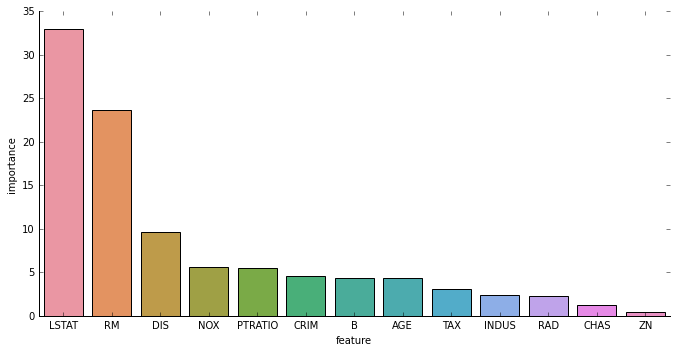

In [23]:
## feature importance

features_to_model = boston_df.drop( columns= 'house_price' ).columns

featureImp_df =   pd.DataFrame(  data=   [   i for i in zip( features_to_model, catboostReg_est.get_feature_importance() )  ],
                                 columns= [ 'feature', 'importance' ]  )

# print( np.sort( catboostReg_est.get_feature_importance() ) )
sns.catplot(  x= 'feature', y= 'importance',
              data= featureImp_df.sort_values( 'importance', ascending= False ),
              kind= 'bar', aspect= 1.9  );

<br>

## SHapley Additive exPlanations (SHAP) 
*[Go to top](#toc)*

SHAP is a game theoretic approach to explain the output of any machine learning model and the features significance.

In [24]:
# !pip install shap
import shap

#### other SHAP plots

In [30]:
health_df = pd.read_csv( 'healthcare-dataset-stroke-data.csv' )

health_df.drop( columns= 'id', inplace= True )
health_df = health_df.dropna()

health_df.head(3)

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1


In [31]:
## One hot encoding udf

def OHE_func( df, categorical_col ):
    '''
    function that returns one=hot-encoded dataframe for the given categorical column list.
    Also removes the original column
    input:
    df = dataframe
    categorical_col = list of string of categorical columns to be one-hot encoded '''
    OHEncoder = sklearn.preprocessing.OneHotEncoder( sparse= False, drop= 'first', dtype= np.int8 )
    OHEncoded_np = OHEncoder.fit_transform( df[categorical_col] )
    OHEncoded_df = pd.DataFrame(OHEncoded_np, index= df.index,
                                columns= OHEncoder.get_feature_names(input_features=categorical_col))
    return(  df.drop( columns= categorical_col )\
            .merge( OHEncoded_df, left_index= True, right_index= True )  )    

In [32]:
cat_col = [ 'gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status' ]

healthCat_df = OHE_func( df = health_df, categorical_col= cat_col ) 

# train test
xtrn,xtst, ytrn, ytst = sklearn.model_selection.train_test_split(
                                healthCat_df.drop( columns= 'stroke' ), healthCat_df[['stroke']],
                                test_size= 30./100  )
print( ytrn[:2] );  xtrn.head(2)

      stroke
4358       0
3192       0


,age,hypertension,heart_disease,avg_glucose_level,bmi,gender_Male,gender_Other,ever_married_Yes,work_type_Never_worked,work_type_Private,work_type_Self-employed,work_type_children,Residence_type_Urban,smoking_status_formerly smoked,smoking_status_never smoked,smoking_status_smokes
4358,26.0,0,0,80.94,22.2,0,0,0,0,1,0,0,1,0,0,1
3192,82.0,1,0,61.47,22.9,0,0,0,0,1,0,0,0,0,1,0


[18:37:31] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


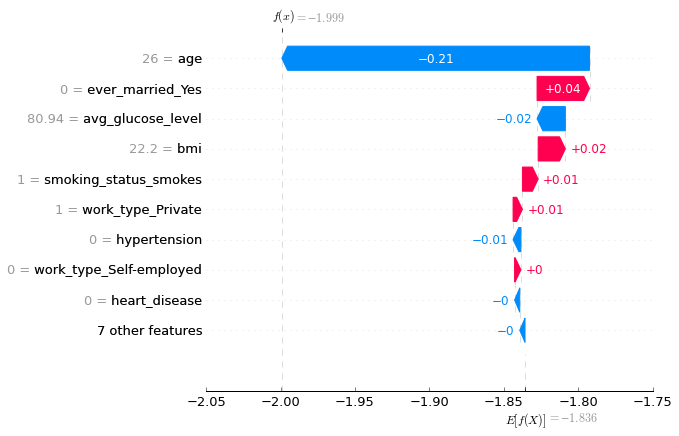

In [50]:
## Water fall plot using xgboost classifier

# boston_df, housePrice = shap.datasets.boston()
xgbReg_est = xgboost.XGBRFClassifier().fit( xtrn, ytrn )

# explain the model's predictions using SHAP
shapExplainer = shap.Explainer( model= xgbReg_est )
shapVal_np = shapExplainer( X= xtrn )

# visualize the first prediction's explanation
shap.plots.waterfall( shap_values= shapVal_np[0] )

#### Beeswarm plot

To get an overview of which features are most important for a model we plot the SHAP values of every feature for every sample. The plot below sorts features by the sum of SHAP value magnitudes over all samples, and uses SHAP values to show the distribution of the impacts each feature has on the model output.

The color represents the feature value (red high, blue low). This reveals for example that a high `Age` increases the chance of stroke, while `Married status` decreases the chance of Stroke.

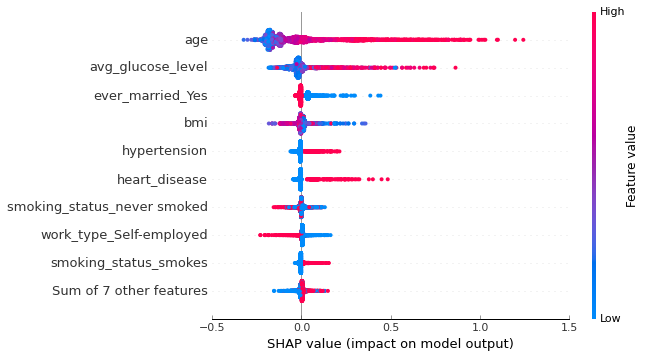

In [52]:
shap.plots.beeswarm( shap_values= shapVal_np )

Plotting the mean absolute value of the SHAP values for each feature as a bar plot (it produces stacked bars for multi-class outputs)

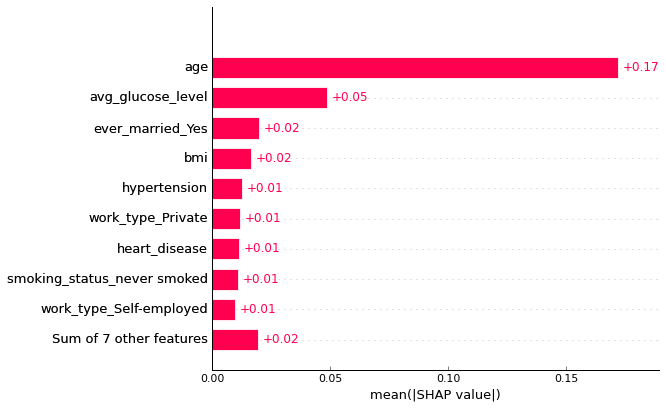

In [53]:
shap.plots.bar( shap_values= shapVal_np )

#### other SHAP plots

In [36]:
## Random forest

randForest_est = sklearn.ensemble.RandomForestClassifier(  )
randForest_est.fit( xtrn, ytrn )

yhat = randForest_est.predict( xtst )

f1_score, accuracy_RF = sklearn.metrics.f1_score( ytst, yhat, average= 'macro' ),
                        sklearn.metrics.accuracy_score( ytst, yhat )

print(  'F1 score --> {:0.3f} \t | \t  Accuracy --> {:0.3f}'.format(f1_score,accuracy_RF)  )

F1 score --> 0.488 	 | 	  Accuracy --> 0.954


#### `SHAP` internal variables

In [43]:
# create shap explainer
shapExplainer = shap.TreeExplainer( model= randForest_est )

# calc shapley vlaues for test data
start_idx, end_idx = 200, 201
shapVal_np = shapExplainer.shap_values( X= xtst[start_idx:end_idx] )

print( len( shapVal_np ), shapVal_np[0].shape, '\n' );                 print( shapVal_np[0], '\n' )

2 (1, 16) 

[[-1.07413783e-01  1.02661479e-03  4.84655069e-03 -3.61538630e-02
  -2.12864731e-02  1.31448530e-02  0.00000000e+00 -1.39699420e-03
  -2.63037196e-06 -1.73820160e-03 -1.46206068e-03 -1.09755637e-03
   1.23636847e-02  1.67546999e-02  1.14910715e-02  2.07659046e-03]] 



`Force plots` allows to observe how features contributed to the model’s prediction for a specific observation. 

The binary target was person had a Stroke ( = 1), or no they didn’t had ( = 0). In the plot below, the bold 0.02 is the model’s score for this observation. Higher scores lead the model to predict 1 and lower scores lead the model to predict 0. The features that were important to making the prediction for this observation are shown in red and blue, with red representing features that pushed the model score higher, and blue representing features that pushed the score lower. Features that had more of an impact on the score are located closer to the dividing boundary between red and blue, and the size of that impact is represented by the size of the bar.
So this particular person was ultimately classified as will not have Stroke (0), because they were pushed higher by all the factors shown in Blue ( Avg Glucose level, no hypertension, no heart disease, etc. ).

In [44]:
## visualize local prediction

shap.initjs()

yhat = randForest_est.predict( xtst[start_idx:end_idx] )[0]
print( f'Random Forest Prediction --> {yhat}' )

shap.force_plot( base_value= shapExplainer.expected_value[1], shap_values= shapVal_np[1],
                 features= xtst[start_idx:end_idx] )

Random Forest Prediction --> 0


If we take many force plot explanations such as the one shown above, rotate them 90 degrees, and then stack them horizontally, we can see explanations for an entire dataset (as done below)

In [40]:
## shap plot for all (or many) obvs

idx_upto = 50
# create shap explainer
shapExplainer = shap.TreeExplainer( model= randForest_est )

# calc shapley vlaues for test data
shapVal_np = shapExplainer.shap_values( X= xtst )

## visualize local prediction
shap.plots.force( base_value= shapExplainer.expected_value[1],shap_values= shapVal_np[1][:idx_upto] )

In [46]:
## shap plot for some (zooming in)
idx_upto = 7
shap.plots.force( base_value= shapExplainer.expected_value[1],shap_values= shapVal_np[1][:idx_upto] )

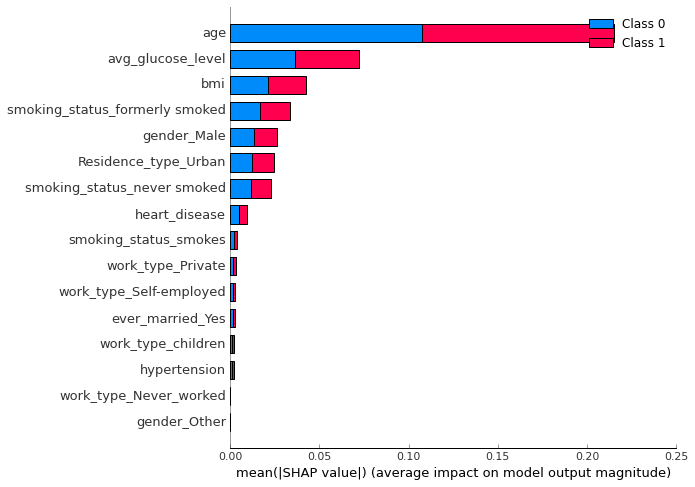

In [47]:
shap.summary_plot( shap_values= shapVal_np, features= xtst )